Building likelihood maps for a set of representative images.



In [1]:
import retinoto_py as fovea
args = fovea.Params(do_fovea=True, batch_size=1)
args

Params(batch_size=1, num_workers=0, prefetch_factor=0, image_size=224, grid_size_ecc=161, grid_size_ang=309, do_mask=False, do_fovea=True, use_hexagonal_grid=True, rs_min=-3.5, rs_max=0.7, angle_start=-5.235987755982989, angle_margin=0.010166966516471823, mode='bilinear', padding_mode='zeros', model_name='convnext_base', num_epochs=100, subset_factor=1, optimizer_name='adamw', loss_name='CrossEntropyLoss', base_lr=1e-06, final_lr=1e-09, num_warmup_epochs=20, delta1=0.3, delta2=0.002, weight_decay=0.0001, label_smoothing=0.0005, do_full_training=True, do_augment=True, augment_proba=0.85, stochastic_depth_prob=0.6, seed=1998, shuffle=True, verbose=False)

In [2]:
import matplotlib.pyplot as plt
print('current DPI:', plt.rcParams['figure.dpi'])  # Check current DPI
plt.rcParams['figure.dpi'] = 72  # Default is 200
print('current DPI:', plt.rcParams['figure.dpi'])  # Check current DPI

current DPI: 200.0
current DPI: 72.0


In [3]:
import torch
from torchvision.io import read_image

In [4]:
# idx_to_label = fovea.get_idx_to_label(args)
label2idx = fovea.get_label_to_idx(args)
label2idx['impala']

352

In [5]:
for key in label2idx.keys(): 
    if 'wolf' in key.lower(): print(key)

wolf_spider
Irish_wolfhound
timber_wolf
white_wolf
red_wolf


In [6]:
dataset = 'bbox'
print(f'Loading models{args.model_name} for dataset: {dataset}')
models= {}
models[False] = fovea.load_model(args, model_filename=args.data_cache / f'21_model_name={args.model_name}_dataset={dataset}.pth')
models[True] = fovea.load_model(args, model_filename=args.data_cache / f'32_fovea_model_name={args.model_name}_dataset={dataset}.pth')
# model = fovea.load_model(args, model_filename=args.data_cache / f'32_fovea_model_name={args.model_name}_dataset={dataset}.pth')

Loading modelsconvnext_base for dataset: bbox


In [7]:
resolution = (21, 34) # landscape images
# resolution = (21, 21)
# resolution = (13, 21) # landscape images
N_fixations = fovea.np.prod(resolution)

# size_ratios = fovea.np.linspace(0.1, 0.9, 9)
# # size_ratios = fovea.np.linspace(0.25, 0.9, 3)
# angles = [0, 45, 90, 135, 180]

size_ratios = [0.1, 0.2, 0.4, 0.6, 0.9]
# angles=[0, 60, 120]
angles=[0, 90, 180]
# TODO test angles=[0, 180] with a vertical flip

image_size_full = 224
image_size_full = 512
# image_size_full = 1024
# image_size_full = 400

alpha = .5
s_max = 200
import cmocean
cmap = cmocean.cm.haline
size_ratios

[0.1, 0.2, 0.4, 0.6, 0.9]

# testing on some sample images

In [8]:
list_images = [('leopard.jpg',  'leopard'),
                # ('wolf.jpg',  'white_wolf'),
                ('frog.jpg',  'tree_frog'),
                # ('Hidden_snow_leopard.png',  'snow_leopard'),
                ('Hidden_leopard.png',  'leopard'),
                # ('Hidden_giraffe.png',  'girafe'),
                ('Hidden_tiger.png',  'tiger'),
                ('Hidden_owl.png',  'great_grey_owl'),
                ]

# list_images = []

type(full_image) = <class 'torch.Tensor'>, full_image.dtype = torch.float32, full_image.shape = torch.Size([3, 512, 697])
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=True] image_url='leopard.jpg' contains a leopard?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000001].


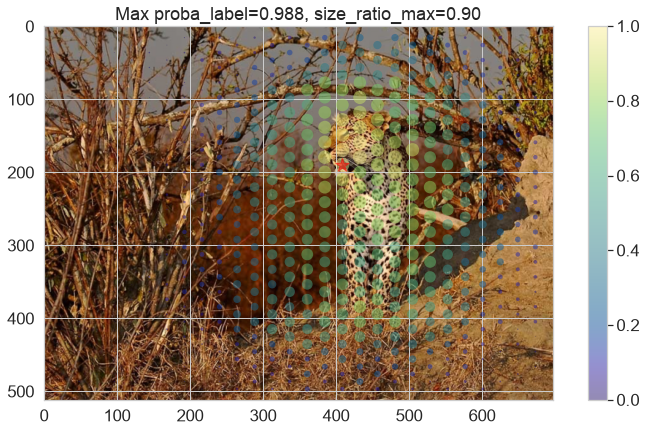

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=False] image_url='leopard.jpg' contains a leopard?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0000001].


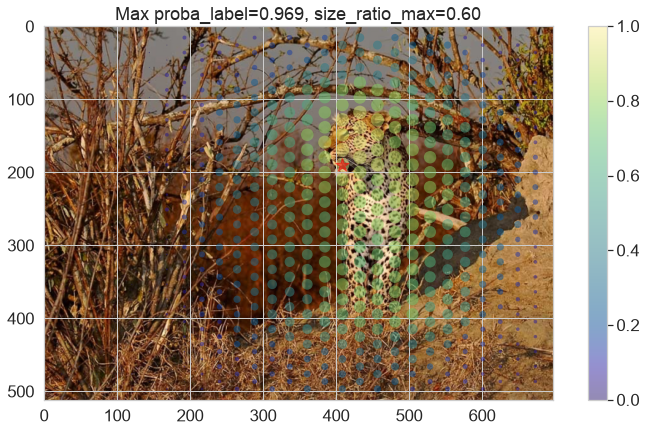

type(full_image) = <class 'torch.Tensor'>, full_image.dtype = torch.float32, full_image.shape = torch.Size([3, 375, 500])
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=True] image_url='frog.jpg' contains a tree_frog?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


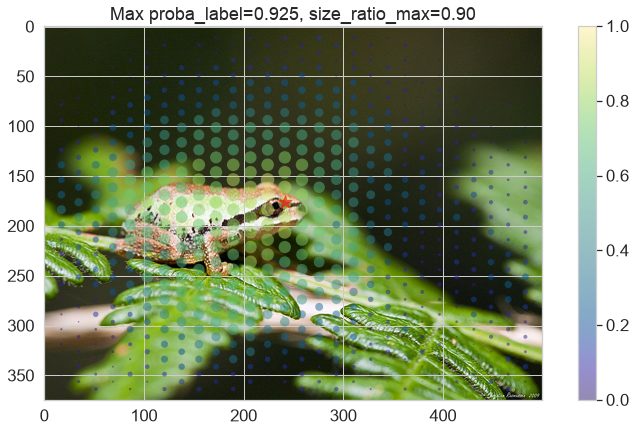

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=False] image_url='frog.jpg' contains a tree_frog?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


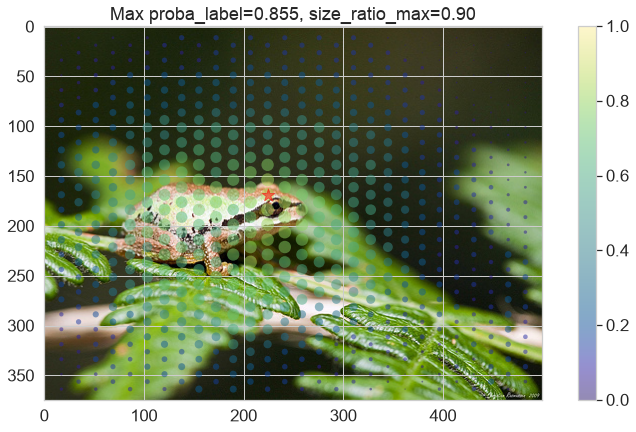

type(full_image) = <class 'torch.Tensor'>, full_image.dtype = torch.float32, full_image.shape = torch.Size([3, 512, 802])
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=True] image_url='Hidden_leopard.png' contains a leopard?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


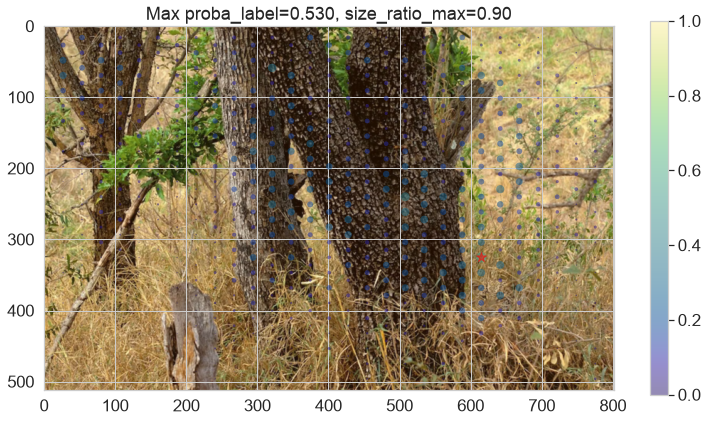

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=False] image_url='Hidden_leopard.png' contains a leopard?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


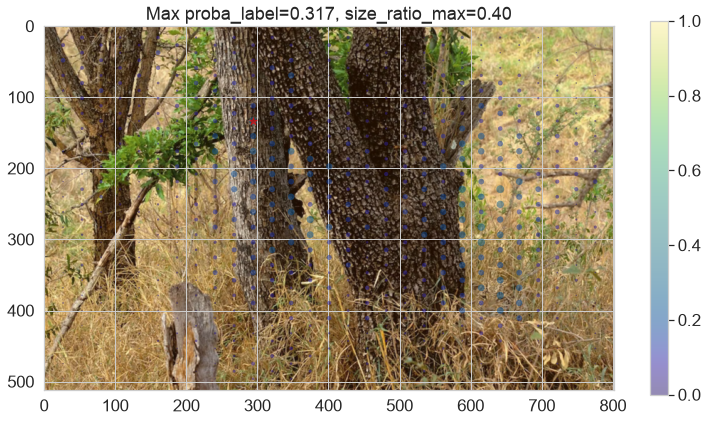

type(full_image) = <class 'torch.Tensor'>, full_image.dtype = torch.float32, full_image.shape = torch.Size([3, 512, 768])
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=True] image_url='Hidden_tiger.png' contains a tiger?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


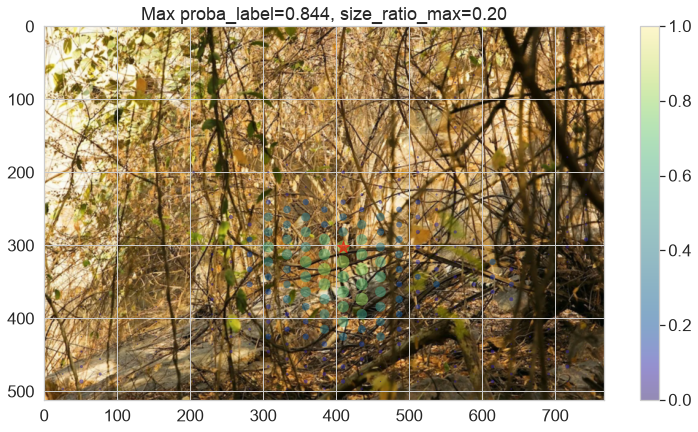

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=False] image_url='Hidden_tiger.png' contains a tiger?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


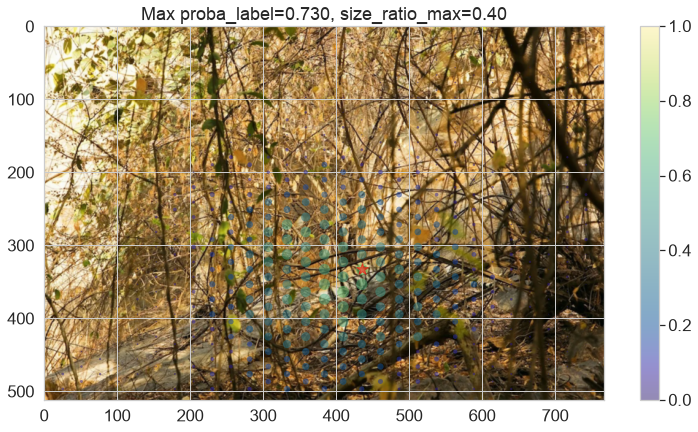

type(full_image) = <class 'torch.Tensor'>, full_image.dtype = torch.float32, full_image.shape = torch.Size([3, 512, 769])
=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=True] image_url='Hidden_owl.png' contains a great_grey_owl?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


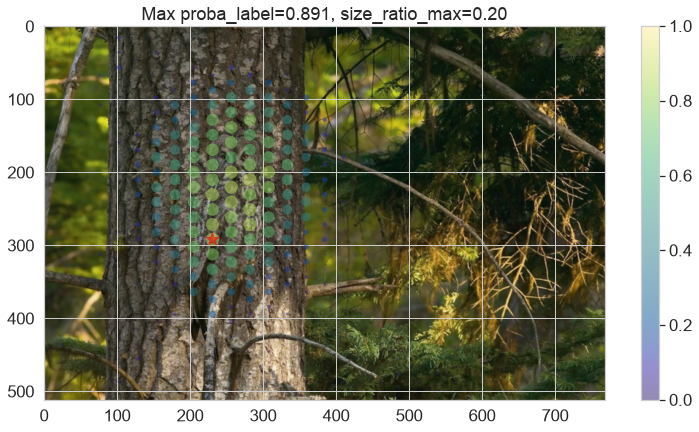

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
[do_fovea=False] image_url='Hidden_owl.png' contains a great_grey_owl?
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


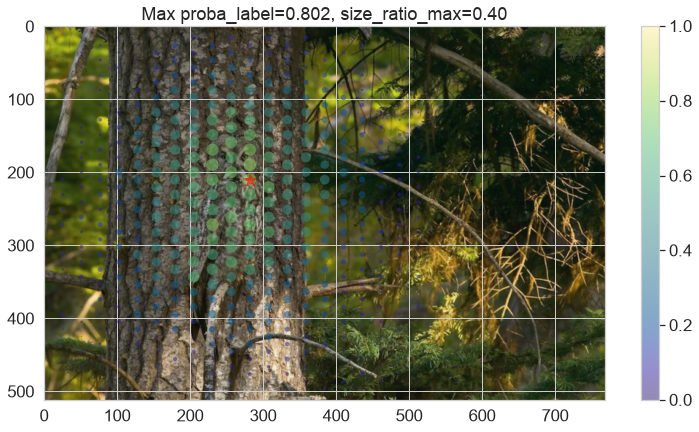

In [9]:
from torchvision.transforms.functional import InterpolationMode, resize
from numpy import sqrt 
do_softmax = True
do_sum = False
do_sum = True

for image_url, true_label in list_images:
    full_image = read_image('./images/' + image_url)[:3, :, :]/255.
    three, H, W = full_image.shape
    if max((H, W)) > image_size_full:
        full_image = resize(full_image, image_size_full, interpolation=InterpolationMode.BILINEAR, antialias=True)
    print(f"{type(full_image) = }, {full_image.dtype = }, {full_image.shape = }")

    three, H, W = full_image.shape
    assert three == 3
    aspect_ratio = H/W 
    resolution_HW = (int(sqrt(N_fixations*sqrt(aspect_ratio))), int(sqrt(N_fixations/sqrt(aspect_ratio))))

    for do_fovea in [True, False]: # [True]: #
        print(50*'=-')
        print(f'[{do_fovea=}] {image_url=} contains a {true_label}?')
        print(50*'.-')

        args = fovea.Params(do_mask=not(do_fovea), do_fovea=do_fovea)

        pos_H, pos_W = fovea.get_positions(full_image.shape[1], full_image.shape[2], resolution=resolution_HW)

        proba_label, proba_label_max, size_ratio_max = None, 0., size_ratios[0]
        for size_ratio in size_ratios:
            for angle in angles:
                probas = fovea.compute_likelihood_map(args, models[do_fovea], full_image, pos_H, pos_W, 
                                                      size_ratio=size_ratio, angle=angle, do_softmax=do_softmax)
                probas = probas.cpu()
                proba_label_ = probas[:, label2idx[true_label]]
                if proba_label_.max() > proba_label_max:
                    proba_label_max = proba_label_.max()
                    size_ratio_max = size_ratio

                if proba_label is None:
                    proba_label = proba_label_
                else:
                    if do_sum:
                        proba_label += proba_label_
                    else:
                        proba_label = torch.maximum(proba_label, proba_label_)

        if do_sum: proba_label = proba_label / len(size_ratios) / len(angles)
        idx_max = proba_label.argmax()

        fig, ax = fovea.plt.subplots()
        full_image_np = torch.movedim(full_image, (1, 2, 0), (0, 1, 2)).cpu().numpy()
        ax.imshow(full_image_np)
        scatter = ax.scatter(pos_W, pos_H, s=proba_label*s_max, c=proba_label, alpha=alpha, edgecolors='none', cmap=cmap, vmin=0, vmax=1)#vmax=proba_label.max())
        ax.set_title(f'Max proba_label={max(proba_label).item():.3f}, size_ratio_max={size_ratio_max:.2f}')

        ax.scatter(pos_W[idx_max], pos_H[idx_max], s=proba_label[idx_max]*s_max, marker='*', c='red', alpha=alpha)
        fig.colorbar(scatter, ax=ax)  # Add colorbar

        fig.set_facecolor(color='white')
        fovea.plt.show()

In [10]:
n_batch = 50
n_batch = 5

do_square = False
do_square = True

cos_30 = fovea.np.cos(fovea.np.pi/6)
# print(cos_30)
# if do_square:
resolution_HW = (int(sqrt(N_fixations*cos_30)), int(sqrt(N_fixations/cos_30)))
print(f"{resolution_HW=}, {cos_30=:.3f}, {resolution_HW[1]/resolution_HW[0]=:.3f}")


resolution_HW=(24, 28), cos_30=0.866, resolution_HW[1]/resolution_HW[0]=1.167


In [11]:
do_square

True

  0%|          | 0/5 [00:00<?, ?it/s]

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 663 = monastery
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


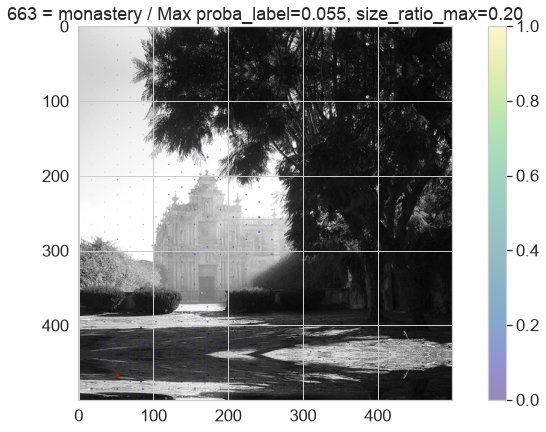

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 380 = titi
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


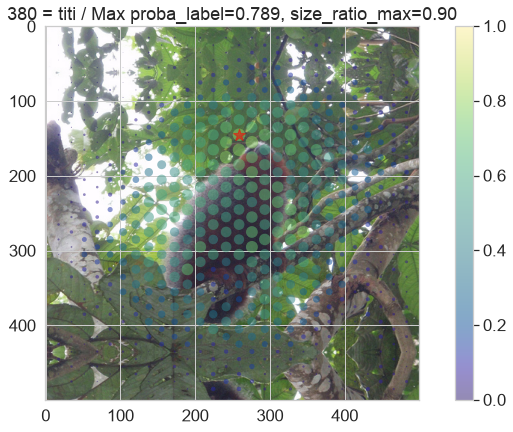

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 940 = spaghetti_squash
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


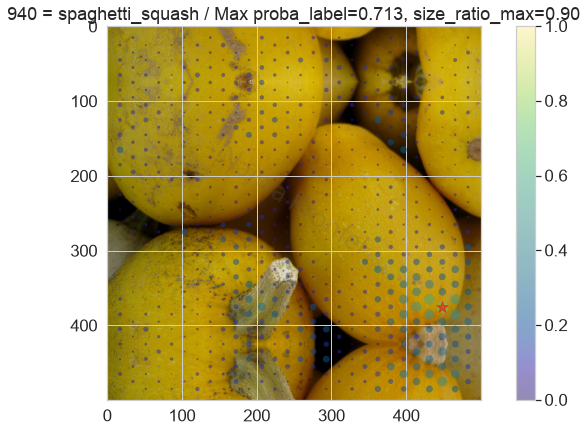

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 811 = space_heater
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


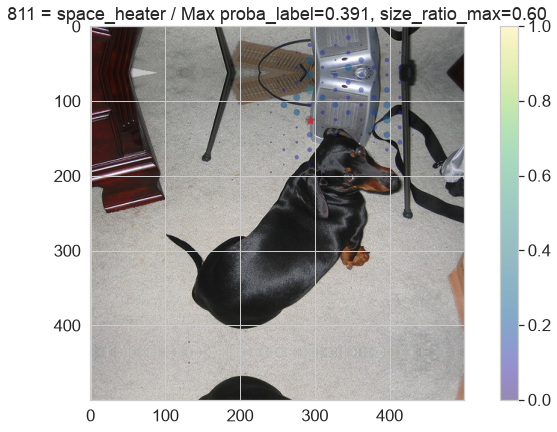

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 923 = plate
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


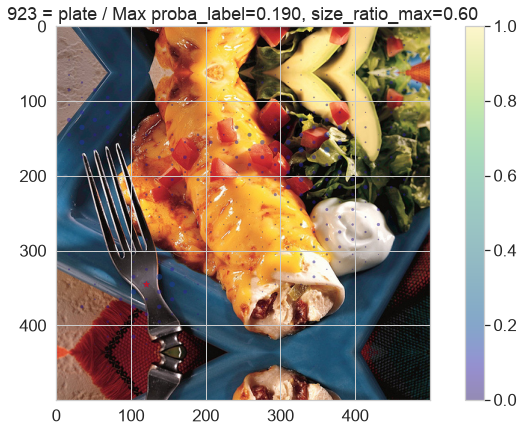

  0%|          | 0/5 [00:00<?, ?it/s]

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 988 = acorn
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


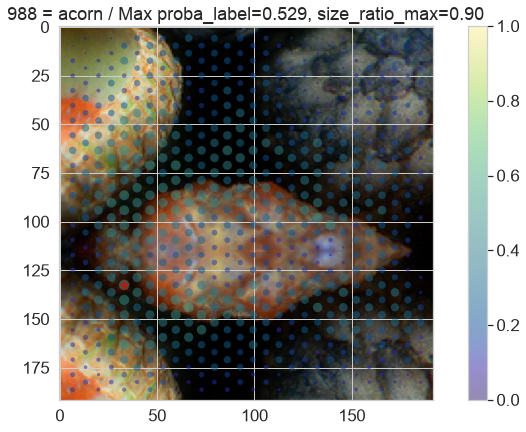

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 909 = wok
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


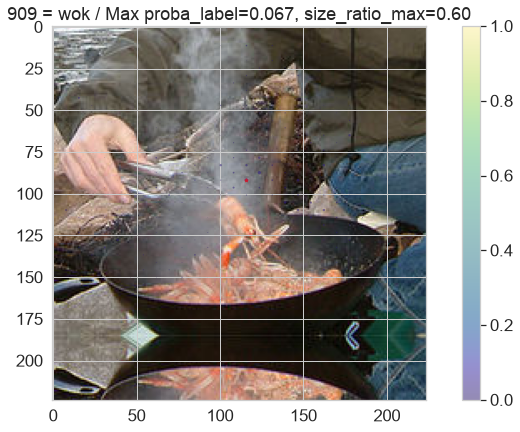

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 29 = axolotl
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


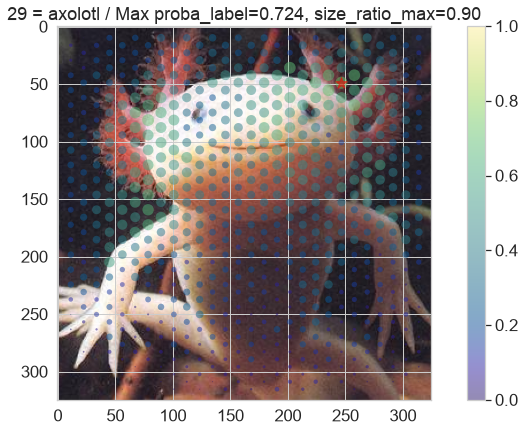

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 222 = kuvasz
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


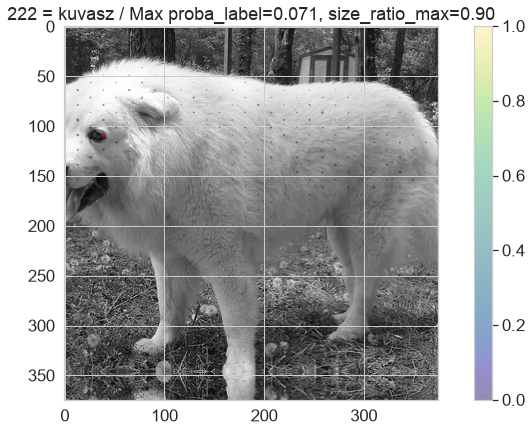

=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
image contains a 343 = warthog
.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-.-


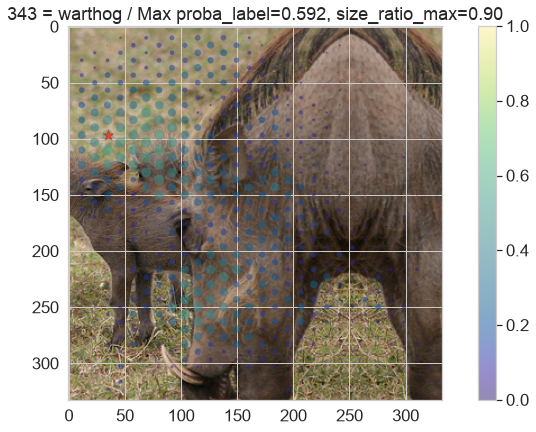

In [12]:
for dataset in fovea.params.all_datasets:
    print(50*'=')
    print(f'{dataset=}')
    print(50*'=')
    args = fovea.Params(do_fovea=True, batch_size=1)

    VAL_DATA_DIR = args.DATAROOT / f'Imagenet_{dataset}' / 'val'
    val_dataset = fovea.get_dataset(args, VAL_DATA_DIR, do_full_preprocess=False)
    val_loader = fovea.get_loader(args, val_dataset)

    for i_batch, (image, true_idx) in fovea.tqdm(enumerate(val_loader), total=n_batch):
        if i_batch >= n_batch:
            break

        print(50*'=-')
        print(f'image contains a {true_idx.item()} = {val_loader.dataset.idx2label[true_idx]}')
        print(50*'.-')

        image = image.squeeze(0).to(args.device)

        # true_idx = true_idx.to(args.device)
        if do_square:
            image = fovea.squarify(image)
            three, H, W = image.shape
            assert H == W, f"aspect ratio should be one but {H=} and {W=} "
        assert three == 3

        if max((H, W)) > image_size_full:
            image = resize(image, image_size_full, 
                           interpolation=InterpolationMode.BILINEAR, antialias=True)
        three, H, W = image.shape

        pos_H, pos_W = fovea.get_positions(H, W, resolution=resolution_HW, do_hex=True)

        proba_label, proba_label_max = None, 0.
        size_ratio_max = size_ratios[0]
        for size_ratio in size_ratios:
            for angle in angles:
                probas = fovea.compute_likelihood_map(args, models[do_fovea], image, pos_H, pos_W, 
                                                      size_ratio=size_ratio, angle=angle, do_softmax=do_softmax)
                probas = probas.cpu()
                proba_label_ = probas[:, true_idx.item()]
                if proba_label_.max() > proba_label_max:
                    proba_label_max = proba_label_.max()
                    size_ratio_max = size_ratio

                if proba_label is None:
                    proba_label = proba_label_
                else:
                    if do_sum:
                        proba_label += proba_label_
                    else:
                        proba_label = torch.maximum(proba_label, proba_label_)

        if do_sum: proba_label = proba_label / len(size_ratios) / len(angles)
        idx_max = proba_label.argmax()

        fig, ax = fovea.plt.subplots()
        image_np = torch.movedim(image, (1, 2, 0), (0, 1, 2)).cpu().numpy()
        ax.imshow(image_np)
        scatter = ax.scatter(pos_W, pos_H, s=proba_label*s_max, c=proba_label, alpha=alpha, edgecolors='none', cmap=cmap, vmin=0, vmax=1)#vmax=proba_label.max())
        ax.set_title(f'{true_idx.item()} = {val_loader.dataset.idx2label[true_idx]} / proba_label={max(proba_label).item():.3f}, size_ratio_max={size_ratio_max:.2f}')

        ax.scatter(pos_W[idx_max], pos_H[idx_max], s=proba_label[idx_max]*s_max, marker='*', c='red', alpha=alpha)
        fig.colorbar(scatter, ax=ax)  # Add colorbar

        fig.set_facecolor(color='white')
        fovea.plt.show()

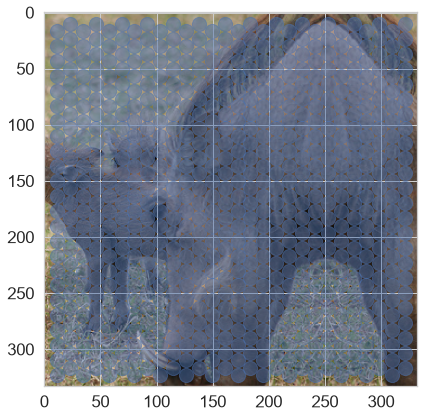

In [13]:
fig, ax = fovea.plt.subplots()
ax.imshow(image_np)
# ax.set_xticks([])
ax.scatter(pos_W.ravel(), pos_H.ravel(), s=s_max, alpha=alpha)
# ax.set_yticks([])
fig.set_facecolor(color='white')

In [14]:
image.squeeze(0).shape

torch.Size([3, 500, 500])

In [15]:
fovea.squarify(image.squeeze(0))

tensor([[[0.282, 0.282, 0.294,  ..., 0.212, 0.216, 0.188],
         [0.298, 0.282, 0.263,  ..., 0.224, 0.224, 0.208],
         [0.294, 0.298, 0.286,  ..., 0.212, 0.224, 0.227],
         ...,
         [0.314, 0.227, 0.165,  ..., 0.184, 0.165, 0.169],
         [0.278, 0.184, 0.165,  ..., 0.153, 0.196, 0.173],
         [0.306, 0.180, 0.133,  ..., 0.184, 0.200, 0.196]],

        [[0.247, 0.247, 0.259,  ..., 0.184, 0.188, 0.161],
         [0.263, 0.247, 0.227,  ..., 0.196, 0.196, 0.180],
         [0.259, 0.263, 0.251,  ..., 0.184, 0.196, 0.200],
         ...,
         [0.271, 0.200, 0.137,  ..., 0.157, 0.137, 0.141],
         [0.235, 0.157, 0.137,  ..., 0.125, 0.169, 0.145],
         [0.263, 0.153, 0.106,  ..., 0.157, 0.173, 0.169]],

        [[0.220, 0.220, 0.231,  ..., 0.153, 0.157, 0.129],
         [0.235, 0.220, 0.200,  ..., 0.165, 0.165, 0.149],
         [0.231, 0.235, 0.224,  ..., 0.161, 0.173, 0.169],
         ...,
         [0.247, 0.176, 0.114,  ..., 0.133, 0.114, 0.118],
         [

(np.float64(-6.034482758620694),
 np.float64(510.9655172413793),
 np.float64(-8.5),
 np.float64(508.5))

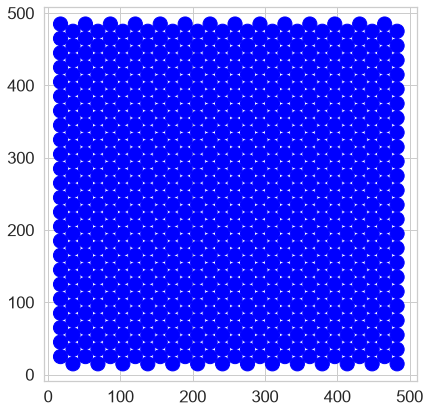

In [16]:
image = fovea.squarify(image.squeeze(0))
three, H, W = image.shape

pos_H, pos_W = fovea.get_positions(H, W, resolution=resolution_HW, do_hex=True)
# print(f'{pos_H = }, {pos_W = }')

fig, ax = fovea.plt.subplots()

ax.scatter(pos_W, pos_H, s=fovea.np.ones_like(pos_W)*s_max, c='blue', alpha=1)
ax.axis('square')

In [17]:
image_np.shape

(333, 333, 3)

In [18]:
# fig, ax = plot_map(size_ratios=np.linspace(0.1, 0.6, 5), angles=angles)

Voilà !